In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install mlxtend
!pip install prefixspan
!pip install squarify

In [3]:
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from datetime import datetime
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import fpgrowth, association_rules
from prefixspan import PrefixSpan
from collections import defaultdict
import plotly.graph_objects as go
import networkx as nx
import warnings
warnings.filterwarnings('ignore')

In [4]:
data = pd.read_csv('/content/drive/MyDrive/cleaned_data.csv')

## Association Rules

PrefixSpan, short for Prefix-Projected Sequential Pattern Mining, is a method used to discover common subsequences in a sequence dataset. It's an efficient, pattern-growth approach for mining the complete set of patterns (or subsequences) that occur frequently within a sequence database.

### Only floor

In [5]:
# Extract the "mos" column as a string
mos_data = data["mos"].astype(str)

# Split the mos data into a list of lists
vector_data = []
for mos in mos_data:
    vector_data.append(mos.split())

# Print the vector data
data["mos_vector"] = vector_data

In [6]:
data[data['resolved']=='floor']

,Unnamed: 0,timestamp_call_key,retailer_code,serial,reason,mos,resolved,no_of_accounts_with_syf_13_march,account_balance_13_march,delinquency_history_13_march,...,no_of_accounts_with_syf_diff,account_balance_diff,delinquency_history_diff,account_open_date_diff,account_status_diff,card_activation_status_diff,eservice_ind_diff,ebill_enrolled_status_diff,auto_pay_enrolled_status_diff,mos_vector
1,1,240315124742 DAL15XHK,E,10006021998,BA,IA BA TS nl TR,floor,2.0,143.28,[00],...,0.0,0.0,False,False,False,False,0,False,0,"[IA, BA, TS, nl, TR]"
4,4,240314145902 DAL68RYS,I,10013002037,BA,IA BA TS nl mm TR,floor,6.0,7.00,[00],...,0.0,0.0,False,False,False,False,0,False,0,"[IA, BA, TS, nl, mm, TR]"
5,5,240314151323 PHX4I30S,I,10013002037,PS,IA BA TS nl PS nl mt RS TR,floor,6.0,7.00,[00],...,0.0,0.0,False,False,False,False,0,False,0,"[IA, BA, TS, nl, PS, nl, mt, RS, TR]"
10,10,240317234904 DAL5X9Y0,B,10007034394,eL,IA BA TS nl eL TR,floor,2.0,NaN,[00],...,0.0,0.0,False,False,False,False,0,False,0,"[IA, BA, TS, nl, eL, TR]"
17,17,240314081235 DAL1ROPP,I,10013000316,BA,IA AA BA MR nl TR,floor,2.0,8.37,[00],...,0.0,0.0,False,False,False,False,0,False,0,"[IA, AA, BA, MR, nl, TR]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1798781,1798781,240315115341 PHX67YL0,e,20005020396,RC,IA PI BA MR nl RC HI TR,floor,4.0,909.39,[00],...,0.0,NaN,False,False,False,False,0,False,0,"[IA, PI, BA, MR, nl, RC, HI, TR]"
1798785,1798785,240314120335 DAL3W50J,a,20001017373,Pd,IA PP BA Pd TR,floor,12.0,3003.14,[00],...,0.0,NaN,False,False,False,False,0,False,0,"[IA, PP, BA, Pd, TR]"
1798792,1798792,240314080117 DAL3CVDQ,b,20002002187,BA,mn IA PP BA MR nl WA nl BA nl mt,floor,9.0,680.86,[00],...,0.0,0.0,False,False,False,False,0,False,0,"[mn, IA, PP, BA, MR, nl, WA, nl, BA, nl, mt]"
1798796,1798796,240317213341 PHX35A2C,d,20010020211,FD,IA IA TR,floor,8.0,386.63,[00],...,0.0,0.0,False,False,False,False,0,False,0,"[IA, IA, TR]"


In [7]:
# PrefixSpan requires a list of lists as input
data_rule = data[data['resolved']=='floor']
sequences = data_rule['mos_vector'].tolist()

ps = PrefixSpan(sequences)

# Find frequent patterns with a minimum support threshold
# Adjust the threshold according to your needs
frequent_patterns = ps.frequent(50000)  # for example, items appearing at least twice

for pattern in frequent_patterns:
    print(pattern)

(366217, ['IA'])
(290976, ['IA', 'BA'])
(123085, ['IA', 'BA', 'TS'])
(111625, ['IA', 'BA', 'TS', 'nl'])
(107242, ['IA', 'BA', 'TS', 'nl', 'TR'])
(55074, ['IA', 'BA', 'TS', 'nl', 'mt'])
(50708, ['IA', 'BA', 'TS', 'nl', 'mt', 'RS'])
(51786, ['IA', 'BA', 'TS', 'nl', 'mt', 'TR'])
(50708, ['IA', 'BA', 'TS', 'nl', 'RS'])
(118028, ['IA', 'BA', 'TS', 'TR'])
(62497, ['IA', 'BA', 'TS', 'mt'])
(57581, ['IA', 'BA', 'TS', 'mt', 'RS'])
(55424, ['IA', 'BA', 'TS', 'mt', 'RS', 'TR'])
(58742, ['IA', 'BA', 'TS', 'mt', 'TR'])
(57581, ['IA', 'BA', 'TS', 'RS'])
(55424, ['IA', 'BA', 'TS', 'RS', 'TR'])
(258604, ['IA', 'BA', 'nl'])
(250176, ['IA', 'BA', 'nl', 'TR'])
(52975, ['IA', 'BA', 'nl', 'nl'])
(127656, ['IA', 'BA', 'nl', 'mt'])
(117380, ['IA', 'BA', 'nl', 'mt', 'RS'])
(113876, ['IA', 'BA', 'nl', 'mt', 'RS', 'TR'])
(121498, ['IA', 'BA', 'nl', 'mt', 'TR'])
(117380, ['IA', 'BA', 'nl', 'RS'])
(113876, ['IA', 'BA', 'nl', 'RS', 'TR'])
(281166, ['IA', 'BA', 'TR'])
(51473, ['IA', 'BA', 'mm'])
(143091, ['IA', 'BA

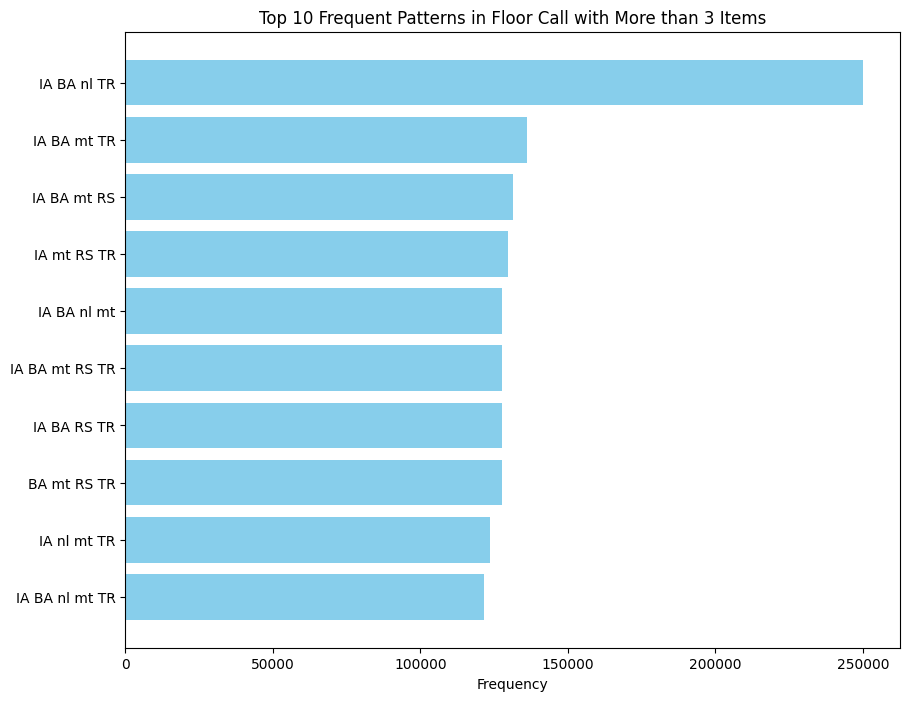

In [8]:
filtered_patterns = [fp for fp in frequent_patterns if len(fp[1]) > 3]


# Sort filtered patterns by frequency and select the top N
top_n = 10  # Adjust based on how many you want to display
top_patterns = sorted(filtered_patterns, key=lambda x: x[0], reverse=True)[:top_n]

# Extract frequencies and pattern strings for plotting
frequencies = [fp[0] for fp in top_patterns]
pattern_strs = [' '.join(fp[1]) for fp in top_patterns]

# Plotting
plt.figure(figsize=(10, 8))
plt.barh(pattern_strs, frequencies, color='skyblue')
plt.xlabel('Frequency')
plt.title(f'Top {top_n} Frequent Patterns in Floor Call with More than 3 Items')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency on top
plt.show()

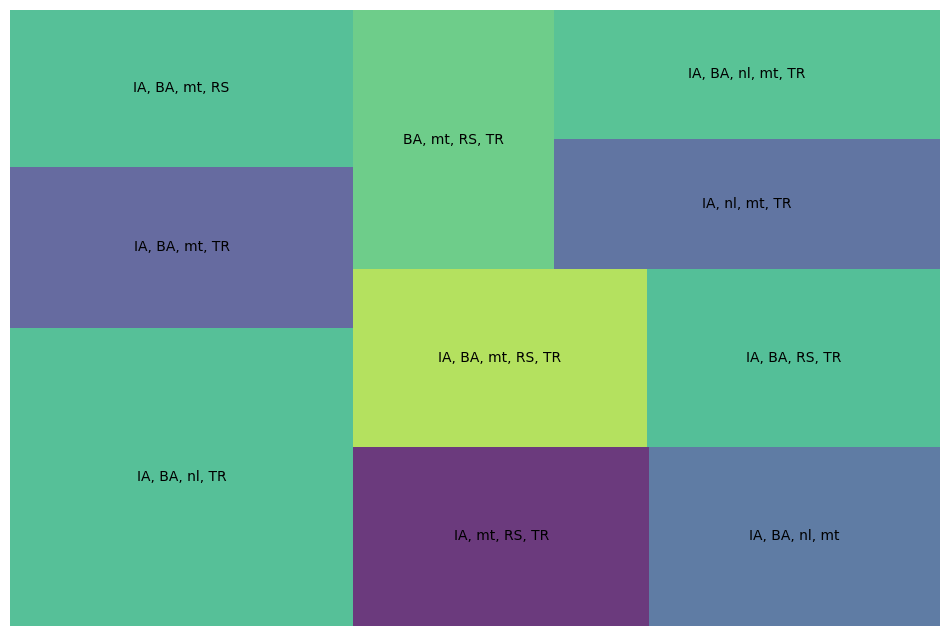

In [9]:
import squarify


# Simplified example: Visualizing top-level item frequencies
# Assume `top_patterns` is a filtered list of patterns, as from previous steps
labels = [', '.join(pattern[1]) for pattern in top_patterns]
sizes = [pattern[0] for pattern in top_patterns]

# Create a tree map
plt.figure(figsize=(12, 8))
squarify.plot(sizes=sizes, label=labels, alpha=0.8)
plt.axis('off')
plt.show()

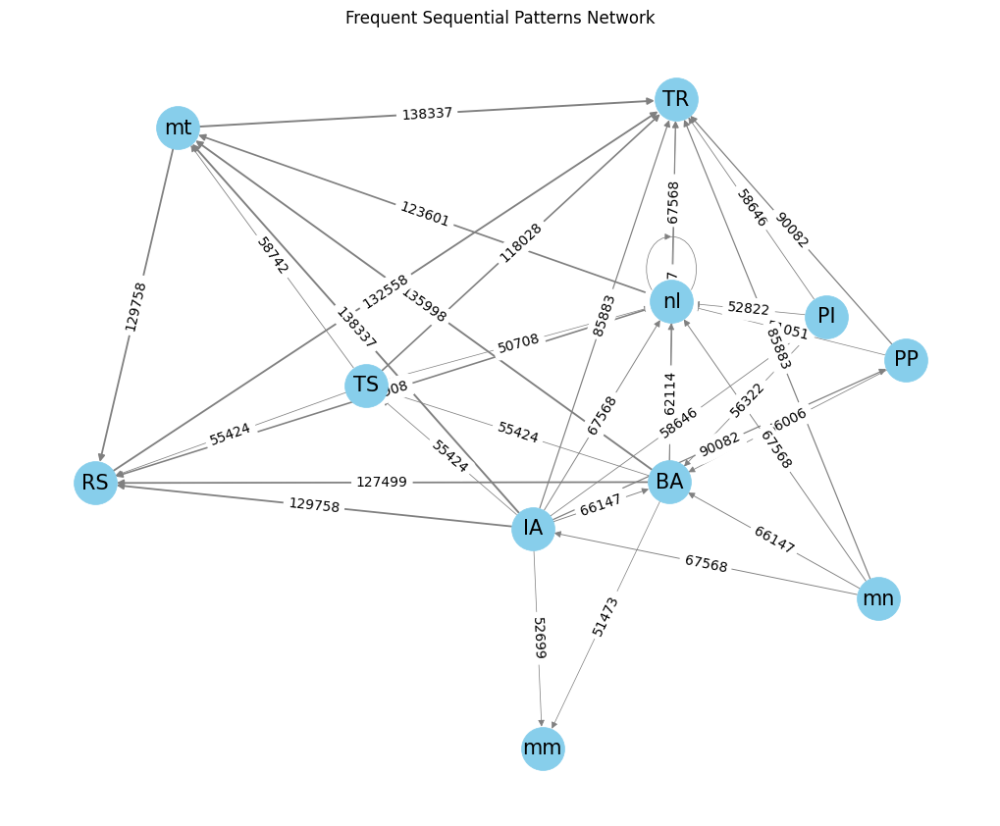

In [10]:
# 创建一个有向图
G = nx.DiGraph()

# 添加节点和有向边
for support, pattern in frequent_patterns:
    # 添加模式中的节点
    for item in pattern:
        G.add_node(item)
    # 添加有向边，根据模式的顺序
    for i in range(len(pattern) - 1):
        # 为了可视化，你可能还想根据支持度设置边的属性
        G.add_edge(pattern[i], pattern[i + 1], weight=support)

# 绘制有向网络图
plt.figure(figsize=(10, 8))
pos = nx.kamada_kawai_layout(G)  # 节点的布局
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=1000,
        edge_color='gray', linewidths=0.5, font_size=15, arrows=True,
        width=[(G[u][v]['weight']/100000) for u,v in G.edges()])

# 添加边的标签（可选，显示支持度）
edge_labels = dict([((u, v,), d['weight'])
                    for u, v, d in G.edges(data=True)])
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

plt.title("Frequent Sequential Patterns Network")
plt.show()

In [11]:
# Initialize structures to hold the mappings and counts
label_to_id = {}
transitions = defaultdict(int)

# Process each pattern
for count, pattern in frequent_patterns:
    for i in range(len(pattern) - 1):
        # Ensure each item has a unique id
        if pattern[i] not in label_to_id:
            label_to_id[pattern[i]] = len(label_to_id)
        if pattern[i + 1] not in label_to_id:
            label_to_id[pattern[i + 1]] = len(label_to_id)

        # Count transitions
        transitions[(pattern[i], pattern[i + 1])] += count

# Generate lists for source, target, and value for the Sankey diagram
sources = []
targets = []
values = []

for (source, target), count in transitions.items():
    sources.append(label_to_id[source])
    targets.append(label_to_id[target])
    values.append(count)

# Generate labels from the unique items
labels = list(label_to_id.keys())

# Create the Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
      pad=15,
      thickness=20,
      line=dict(color="black", width=0.5),
      label=labels,
    ),
    link=dict(
      source=sources,
      target=targets,
      value=values,
    ))])

fig.update_layout(title_text="Sankey Diagram of Item Transitions", font_size=10)
fig.show()

In [12]:
import plotly.graph_objects as go
from collections import defaultdict

# 初始化结构以保存映射和计数
label_to_id = {}
transitions = defaultdict(int)

# 设置出现次数的阈值
threshold = 50000  # 例如，只包括出现次数至少为5的转换

data_rule = data[data['resolved']=='floor']
# 处理每个模式
for pattern in data_rule['mos_vector']:
    for i in range(len(pattern) - 1):
        if pattern[i] not in label_to_id:
            label_to_id[pattern[i]] = len(label_to_id)
        if pattern[i + 1] not in label_to_id:
            label_to_id[pattern[i + 1]] = len(label_to_id)
        transitions[(pattern[i], pattern[i + 1])] += 1  # 假设每个模式出现一次

# 筛选出满足阈值条件的转换
filtered_transitions = {k: v for k, v in transitions.items() if v >= threshold}

# 生成源、目标和值的列表
sources = []
targets = []
values = []

for (source, target), count in filtered_transitions.items():
    sources.append(label_to_id[source])
    targets.append(label_to_id[target])
    values.append(count)

# 从唯一项生成标签
labels = list(label_to_id.keys())

# 创建Sankey图
fig = go.Figure(data=[go.Sankey(
    node=dict(
      pad=15,
      thickness=20,
      line=dict(color="black", width=0.5),
      label=labels,
    ),
    link=dict(
      source=sources,
      target=targets,
      value=values,
    ))])

fig.update_layout(title_text="Sankey Diagram of Item Transitions (Floor call)", font_size=10)
fig.show()


Links (Flow Paths): The flowing, connecting paths between nodes represent the transfer or flow of the quantity from one node to another. The width of these paths is significant as it indicates the amount or volume of the flow. The width of the bands or links between the nodes is proportional to the flow quantity; thicker bands represent larger flows.

Node:


*   IA: Identification and authentication
*   BA: Account Summary
*   TS: SMS Account Summary
*   mn: menu upfront
*   mm: main menu
    >It is used when nl prompt does not recognize what the customer is saying due to low volume, noise, too verbose inquiry beyond NLUs capabilities, or speaker accent, etc. mm allows the caller to hear the menu options or IVR functions and use the phone keypad to select their option or say their option. It is also used if IVR already had problem understanding the caller earlier in the call, as well as all Spanish callers since NLU currently does not understand spoke Spanish.
*   nl: NLU menu How may I help you
    > I understand and can help you with that (Voice)
      I understand and have a better option for you (Digital)
      I understand and will get you help (Associate)
      I’m not understanding (Associate)

*   PI: Proactive Income
    > Part of our risk models look at the customers credit line and ability to repay. When credit account is set up we ask for the customers income. That helps us to determine how high their credit limit is. Proactive income is us asking what is your income to populate that in our records. We might have lost their income value or might be wanting to raise/lower their credit line. Ie we wouldn' t give someone a 10k credit line if their annual income is 15k
*   mt: pre transfer menu
    > Context regarding Pre-Transfer menu
      If enabled for the client, the pre-transfer menu (mt) can present the following information, as applicable to the caller:
      If there's a longer hold time, this is mentioned to the caller to set expectations.Back to 'nl' - Always presented SMS to make a payment (mobile pay) - if applicable Link to register for eService (online) - if caller is unregistered Link to Chat online with a live agent (Live Chat) - if agents are available and offer is applicable to the client Continue transfer to an agent - always presented
*   RS: Global router
    > Upfront Routers
      **RS** or **mn** indicates an upfront router. Not all clients have them. The router usually presents two main options:
      if they’re calling with questions related to the client, they can select the option that will transfer them to the client’s IVR (e.g. Amazon customer has a question about their Amazon Prime order, not their Synchrony Credit account with Amazon)If The caller wants to service their Synchrony account for x client , they can select the option that continues in the SYF IVR. Their next MOS code is typically IA
*   pp: PBP Predictive
    > PBP Predictive = looks like you may be calling to make a payment - if yes, then fast path transfer to the Payment IVR so customer don't need to listen to the Account summary and the NLU prompt."PBP" stands for Pay-By-Phone.  Other payment fund transfer methods are via the customer's bank, or send in a check or pre-approved payments or in store payments, etc.
*   TR: Transfer
    > Resolved indicates the caller hung up. TR indicates we played the call transfer message. If you see a call with TR and Resolved they hung up before being connected to the cs rep (floor)

    





### With resolved

In [13]:
# 初始化结构以保存映射和计数
label_to_id = {}
transitions = defaultdict(int)

# 设置出现次数的阈值
threshold = 50000  # 例如，只包括出现次数至少为5的转换
data_rule1 = data[data['resolved'] == 'resolved']
# 假设 data_rule['mos_vector'] 是一个Pandas Series，每个元素是一个模式的列表
# 处理每个模式
for pattern in data_rule1['mos_vector']:
    for i in range(len(pattern) - 1):
        if pattern[i] not in label_to_id:
            label_to_id[pattern[i]] = len(label_to_id)
        if pattern[i + 1] not in label_to_id:
            label_to_id[pattern[i + 1]] = len(label_to_id)
        transitions[(pattern[i], pattern[i + 1])] += 1  # 假设每个模式出现一次

# 筛选出满足阈值条件的转换
filtered_transitions = {k: v for k, v in transitions.items() if v >= threshold}

# 生成源、目标和值的列表
sources = []
targets = []
values = []

for (source, target), count in filtered_transitions.items():
    sources.append(label_to_id[source])
    targets.append(label_to_id[target])
    values.append(count)

# 从唯一项生成标签
labels = list(label_to_id.keys())

# 创建Sankey图
fig = go.Figure(data=[go.Sankey(
    node=dict(
      pad=15,
      thickness=20,
      line=dict(color="black", width=0.5),
      label=labels,
    ),
    link=dict(
      source=sources,
      target=targets,
      value=values,
    ))])

fig.update_layout(title_text="Sankey Diagram of Item Transitions(Resolved call)", font_size=10)
fig.show()


In [14]:
# 初始化结构以保存映射、计数和状态
label_to_id = {}
transitions = defaultdict(int)
transition_status = {}  # 用于保存每个转换的状态


# 处理每个模式
for index, row in data.iterrows():
    pattern = row['mos_vector']
    resolved_status = row['resolved']
    for i in range(len(pattern) - 1):
        if pattern[i] not in label_to_id:
            label_to_id[pattern[i]] = len(label_to_id)
        if pattern[i + 1] not in label_to_id:
            label_to_id[pattern[i + 1]] = len(label_to_id)

        transitions[(pattern[i], pattern[i + 1])] += 1  # 假设每个模式出现一次
        transition_status[(pattern[i], pattern[i + 1])] = resolved_status  # 记录状态

# 筛选出满足阈值条件的转换
threshold = 50000
filtered_transitions = {k: v for k, v in transitions.items() if v >= threshold}

# 生成源、目标、值和颜色的列表
sources = []
targets = []
values = []
colors = []

for (source, target), count in filtered_transitions.items():
    sources.append(label_to_id[source])
    targets.append(label_to_id[target])
    values.append(count)
    # 根据转换状态分配颜色
    if transition_status[(source, target)] == 'resolved':
        colors.append('rgba(0,255,0,0.5)')  # 绿色表示resolved
    else:
        colors.append('rgba(255,0,0,0.5)')  # 红色表示floor

# 从唯一项生成标签
labels = list(label_to_id.keys())

# 创建Sankey图
fig = go.Figure(data=[go.Sankey(
    node=dict(
      pad=15,
      thickness=20,
      line=dict(color="black", width=0.5),
      label=labels,
    ),
    link=dict(
      source=sources,
      target=targets,
      value=values,
      color=colors,  # 指定链接颜色
    ))])

fig.update_layout(title_text="Sankey Diagram of Item Transitions with Status", font_size=10)
fig.show()

# Difference between resolved and floor

In [15]:
data.describe()

,Unnamed: 0,serial,no_of_accounts_with_syf_13_march,account_balance_13_march,eservice_ind_13_march,auto_pay_enrolled_status_13_march,no_of_accounts_with_syf_18_march,account_balance_18_march,eservice_ind_18_march,auto_pay_enrolled_status_18_march,...,previous_delinquency_delinquency_history_13_march,current_delinquency_delinquency_history_18_march,previous_delinquency_delinquency_history_18_march,call_count,years_since_opened,years_since_opened_full,no_of_accounts_with_syf_diff,account_balance_diff,eservice_ind_diff,auto_pay_enrolled_status_diff
count,1.798798e+06,1.798798e+06,1.795398e+06,1.685016e+06,1.798798e+06,1.798798e+06,1.795396e+06,1.696969e+06,1.798798e+06,1.798798e+06,...,1.798798e+06,1.798798e+06,1.798798e+06,1.798798e+06,1.798798e+06,1.798798e+06,1.795396e+06,1.684693e+06,1.798798e+06,1.798798e+06
mean,8.993985e+05,1.497679e+10,4.938873e+00,1.317626e+03,3.295673e-01,2.248835e-02,4.948396e+00,1.317619e+03,3.339997e-01,2.272240e-02,...,9.474605e-02,9.664287e-02,9.662063e-02,1.261260e+00,5.430595e+00,4.947621e+00,9.519905e-03,9.648912e-01,4.432404e-03,2.340452e-04
std,5.192684e+05,5.000029e+09,3.623405e+00,1.972779e+03,4.700562e-01,1.482654e-01,3.627627e+00,1.979695e+03,4.716397e-01,1.490171e-01,...,4.913620e-01,4.869507e-01,4.958338e-01,6.463386e-01,6.236062e+00,6.215346e+00,1.276373e-01,3.302513e+02,6.669588e-02,2.544799e-02
min,0.000000e+00,1.000100e+10,1.000000e+00,-2.559600e+04,0.000000e+00,0.000000e+00,1.000000e+00,-2.559600e+04,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,5.475702e-03,0.000000e+00,-2.000000e+01,-3.685100e+04,-1.000000e+00,-1.000000e+00
25%,4.496992e+05,1.000400e+10,2.000000e+00,1.149700e+02,0.000000e+00,0.000000e+00,2.000000e+00,1.144800e+02,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.248460e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,8.993985e+05,1.003100e+10,4.000000e+00,5.715850e+02,0.000000e+00,0.000000e+00,4.000000e+00,5.686500e+02,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,3.359343e+00,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,1.349098e+06,2.000307e+10,7.000000e+00,1.716582e+03,1.000000e+00,0.000000e+00,7.000000e+00,1.715620e+03,1.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,7.509925e+00,7.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,1.798797e+06,2.005400e+10,1.210000e+02,5.864171e+04,1.000000e+00,1.000000e+00,1.210000e+02,6.983241e+04,1.000000e+00,1.000000e+00,...,8.000000e+00,8.000000e+00,8.000000e+00,2.400000e+01,7.184668e+01,7.100000e+01,2.100000e+01,3.537900e+04,1.000000e+00,1.000000e+00


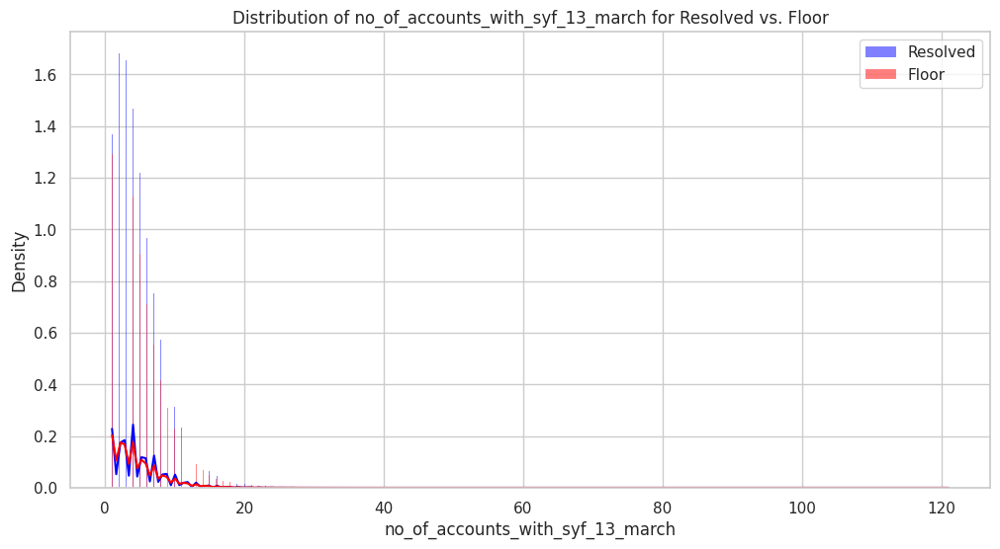

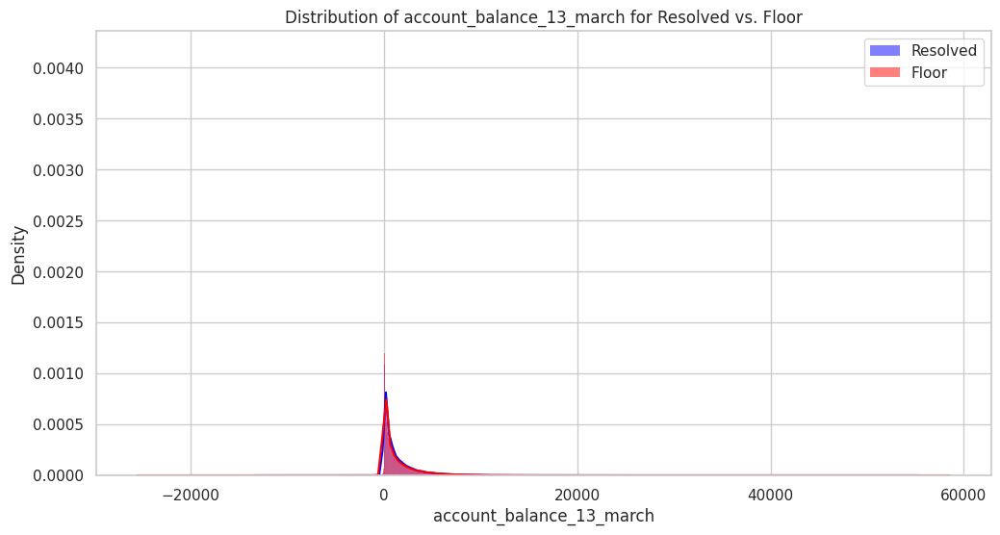

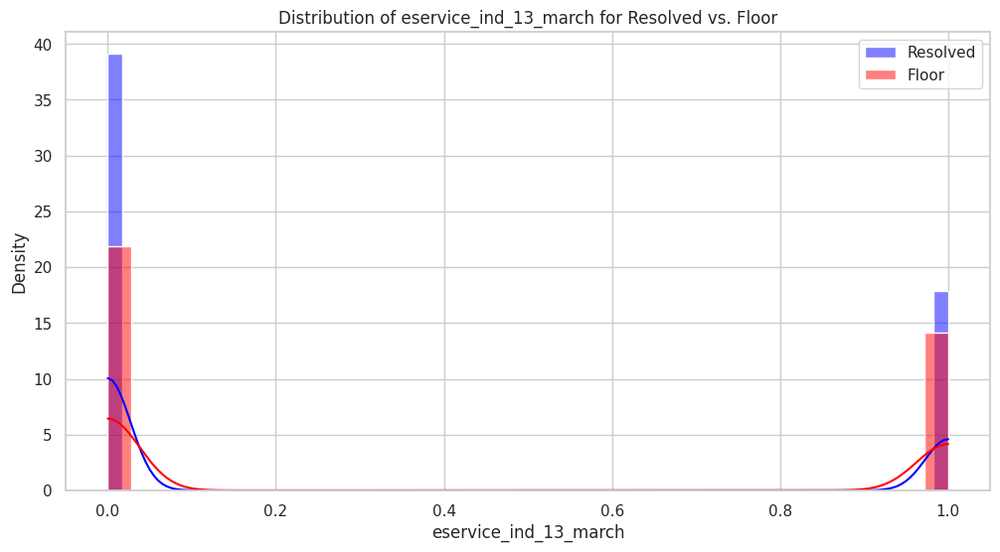

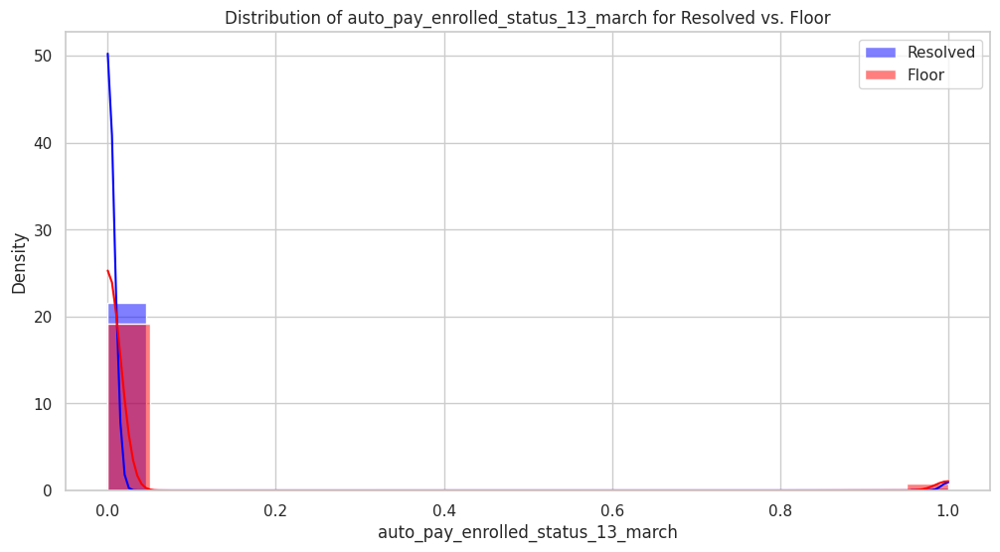

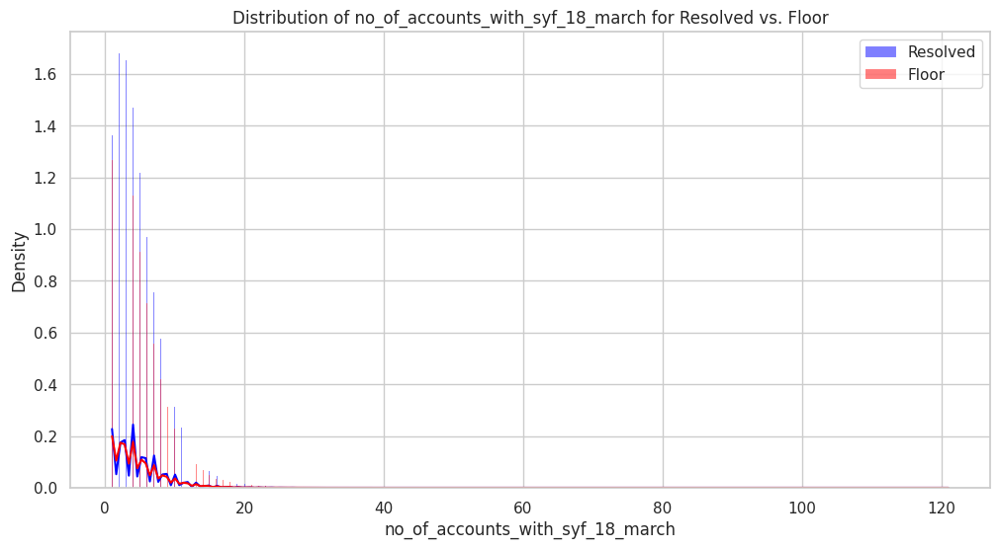

...

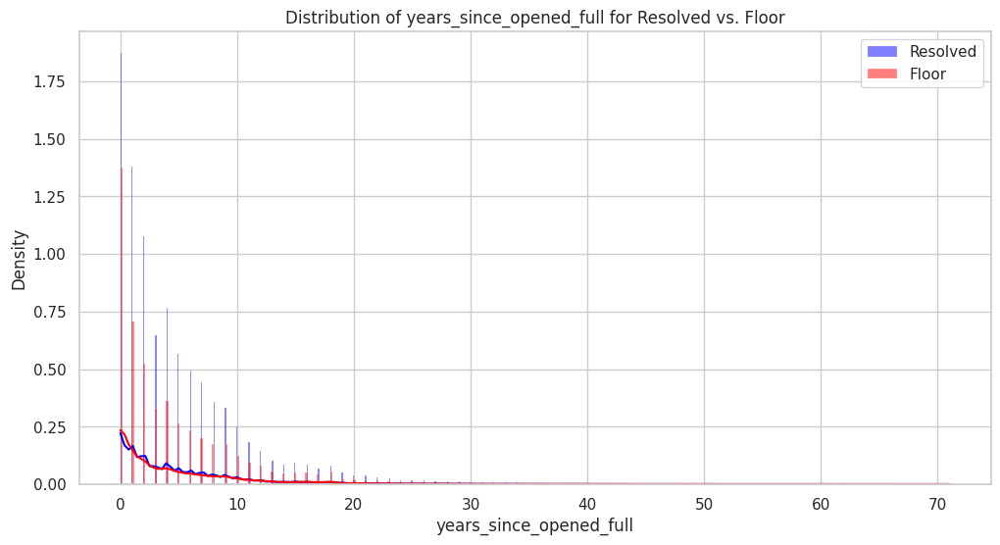

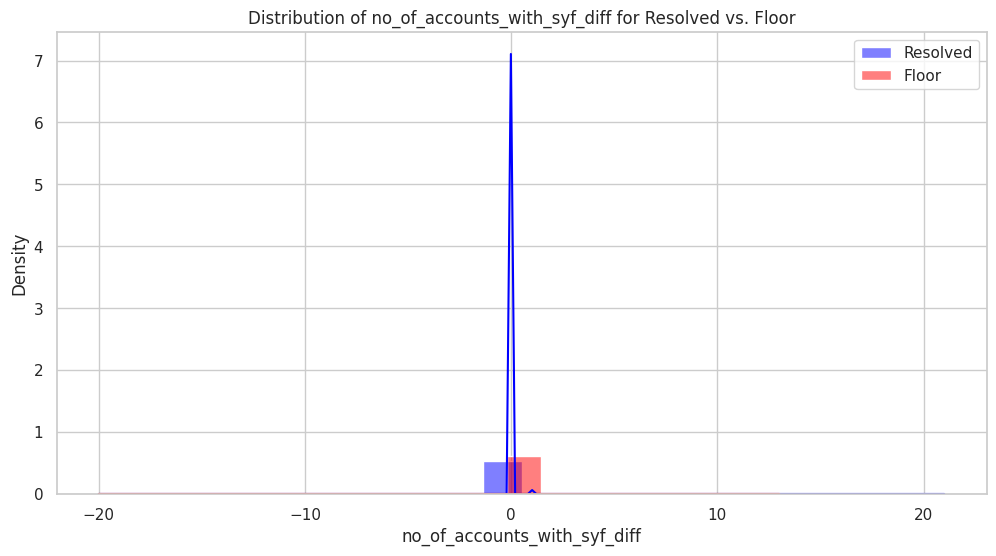

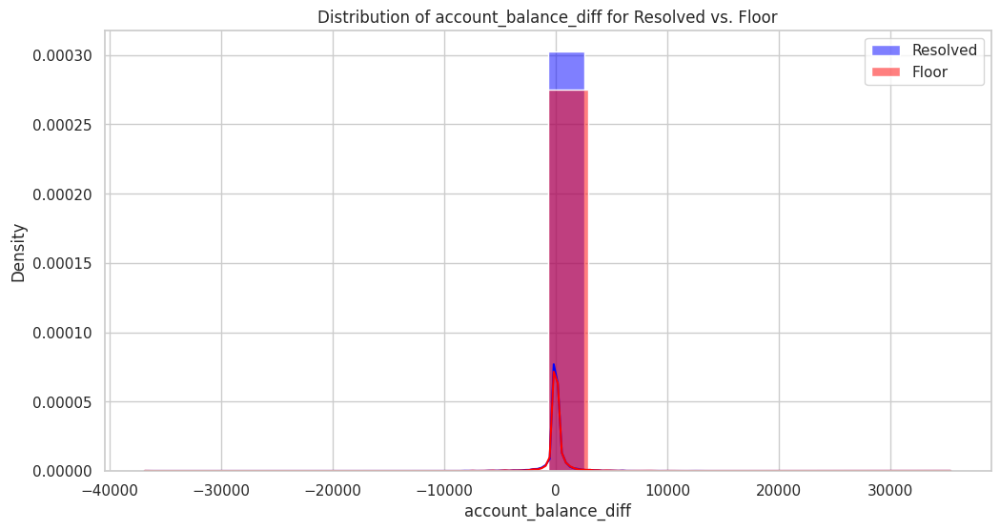

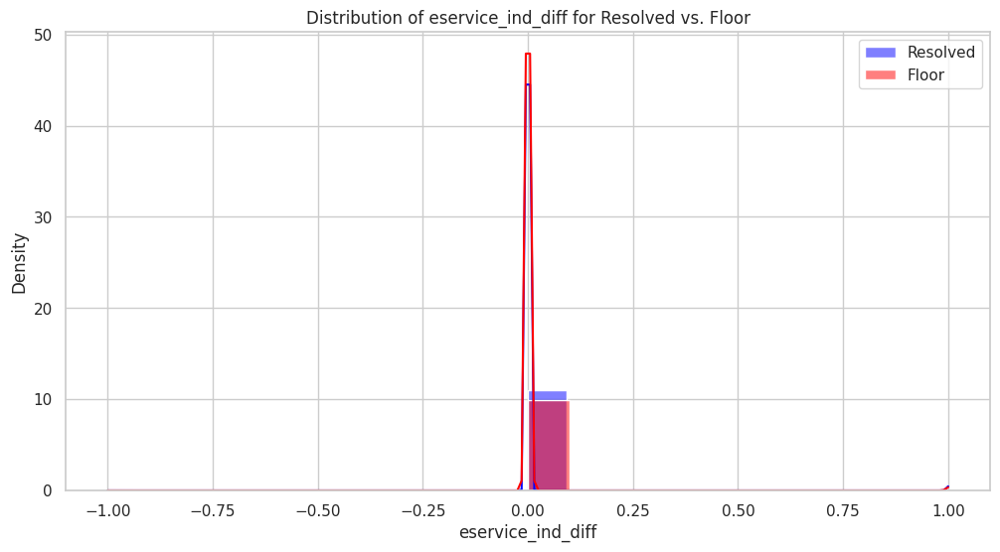

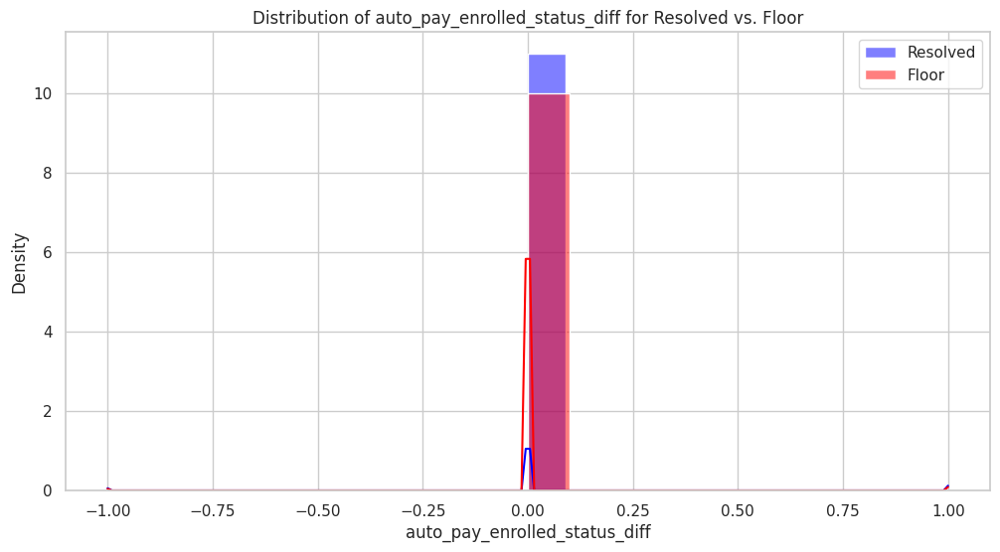

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your pandas DataFrame.
resolved_data = data[data['resolved'] == 'resolved']
floor_data = data[data['resolved'] == 'floor']

# Extract the columns we're interested in
columns_to_compare = [
    'no_of_accounts_with_syf_13_march', 'account_balance_13_march', 'eservice_ind_13_march',
    'auto_pay_enrolled_status_13_march', 'no_of_accounts_with_syf_18_march', 'account_balance_18_march',
    'eservice_ind_18_march', 'auto_pay_enrolled_status_18_march', 'previous_delinquency_delinquency_history_13_march',
    'current_delinquency_delinquency_history_18_march', 'previous_delinquency_delinquency_history_18_march',
    'call_count', 'years_since_opened', 'years_since_opened_full', 'no_of_accounts_with_syf_diff',
    'account_balance_diff', 'eservice_ind_diff', 'auto_pay_enrolled_status_diff'
    # ... include all other columns you wish to compare
]

# Set the aesthetics for the plots
sns.set(style="whitegrid")

# Loop through the columns and create histograms for each.
for column in columns_to_compare:
    plt.figure(figsize=(12, 6))

    # Overlay the two histograms for comparison
    sns.histplot(resolved_data[column], color="blue", label='Resolved', kde=True, stat="density", common_norm=False)
    sns.histplot(floor_data[column], color="red", label='Floor', kde=True, stat="density", common_norm=False)

    plt.title(f'Distribution of {column} for Resolved vs. Floor')
    plt.xlabel(column)
    plt.ylabel('Density')
    plt.legend()

    # Show plot
    plt.show()



In [17]:
data.columns

Index(['Unnamed: 0', 'timestamp_call_key', 'retailer_code', 'serial', 'reason',
       'mos', 'resolved', 'no_of_accounts_with_syf_13_march',
       'account_balance_13_march', 'delinquency_history_13_march',
       'account_open_date_13_march', 'account_status_13_march',
       'card_activation_status_13_march', 'eservice_ind_13_march',
       'ebill_enrolled_status_13_march', 'auto_pay_enrolled_status_13_march',
       'no_of_accounts_with_syf_18_march', 'account_balance_18_march',
       'delinquency_history_18_march', 'account_open_date_18_march',
       'account_status_18_march', 'card_activation_status_18_march',
       'eservice_ind_18_march', 'ebill_enrolled_status_18_march',
       'auto_pay_enrolled_status_18_march',
       'account_status_description_13_march',
       'account_status_description_18_march',
       'current_delinquency_delinquency_history_13_march',
       'previous_delinquency_delinquency_history_13_march',
       'current_delinquency_delinquency_history_18_m

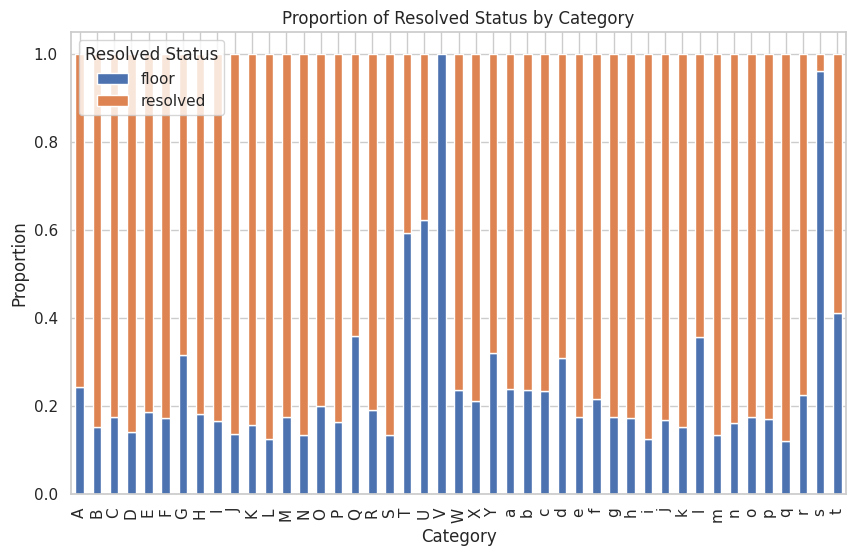

In [18]:
# Convert the data to a format suitable for a stacked bar chart
cross_tab = pd.crosstab(data['retailer_code'], data['resolved'])

cross_tab_prop = cross_tab.div(cross_tab.sum(axis=1), axis=0)

# Plot as a stacked bar chart
cross_tab_prop.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Proportion of Resolved Status by Category')
plt.xlabel('Category')
plt.ylabel('Proportion')
plt.legend(title='Resolved Status')
plt.show()

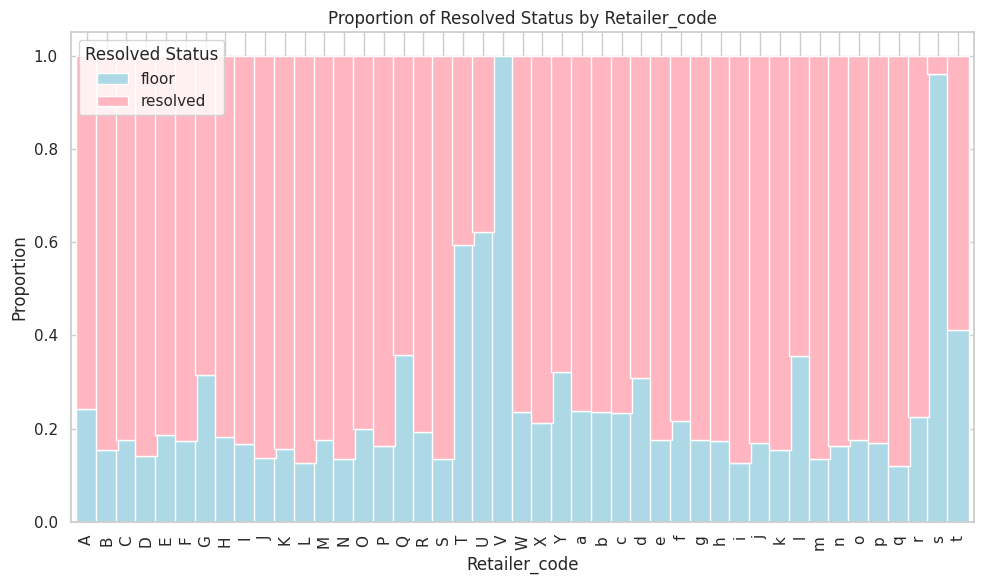

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has columns 'retailer_code' and 'resolved'

# Convert the data to a format suitable for a stacked bar chart
cross_tab = pd.crosstab(data['retailer_code'], data['resolved'])

# Calculate proportions
cross_tab_prop = cross_tab.div(cross_tab.sum(axis=1), axis=0)

# Plot as a stacked bar chart
# Adjust bar width using `width` parameter to remove gaps between bars
# Use lighter colors by specifying the `color` parameter
ax = cross_tab_prop.plot(kind='bar', stacked=True, figsize=(10, 6), width=1.1,
                         color=['#add8e6', '#ffb6c1'])  # Light blue and light pink, for example

plt.title('Proportion of Resolved Status by Retailer_code')
plt.xlabel('Retailer_code')
plt.ylabel('Proportion')
plt.legend(title='Resolved Status')
plt.tight_layout()  # Adjust the layout to make room for the labels
plt.show()


In [32]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming 'columns_to_compare' is defined as above
columns_to_compare = [
    'no_of_accounts_with_syf_13_march','previous_delinquency_delinquency_history_13_march',
    'current_delinquency_delinquency_history_13_march',
    'call_count', 'years_since_opened', 'years_since_opened_full',
    'account_balance_diff']
columns_to_compare = [
    'call_count',  'years_since_opened_full',
    'account_balance_diff'
    # ... include all other columns you wish to compare
]
# Create subplots: one row per column to compare
fig = make_subplots(rows=len(columns_to_compare), cols=1, subplot_titles=columns_to_compare)

for i, column in enumerate(columns_to_compare, start=1):
    # Resolved data histogram
    fig.add_trace(
        go.Histogram(x=resolved_data[column], name='Resolved', marker_color='blue', opacity=0.75),
        row=i, col=1
    )

    # Floor data histogram
    fig.add_trace(
        go.Histogram(x=floor_data[column], name='Floor', marker_color='red', opacity=0.75),
        row=i, col=1
    )

# Update layout for a cleaner look
fig.update_layout(height=300*len(columns_to_compare), width=900, title_text="Distribution of Various Columns for Resolved vs. Floor", showlegend=True)
fig.update_traces(bingroup=1) # To ensure histograms are comparable
fig.update_layout(barmode='overlay') # Overlay histograms for direct comparison

# Show plot
fig.show()


# Reason Distribution

   reason   count  resolved_proportion
0      PP  678314             0.950521
1      BA  566351             0.720325
2      PT  221583             0.917372
3      AT   91404             0.904960
4      AA   54861             0.724959
..    ...     ...                  ...
68     iT       2             0.500000
69     mo       1             0.000000
70     mm       1             1.000000
71     ss       1             0.000000
72     HI       1             0.000000

[73 rows x 3 columns]


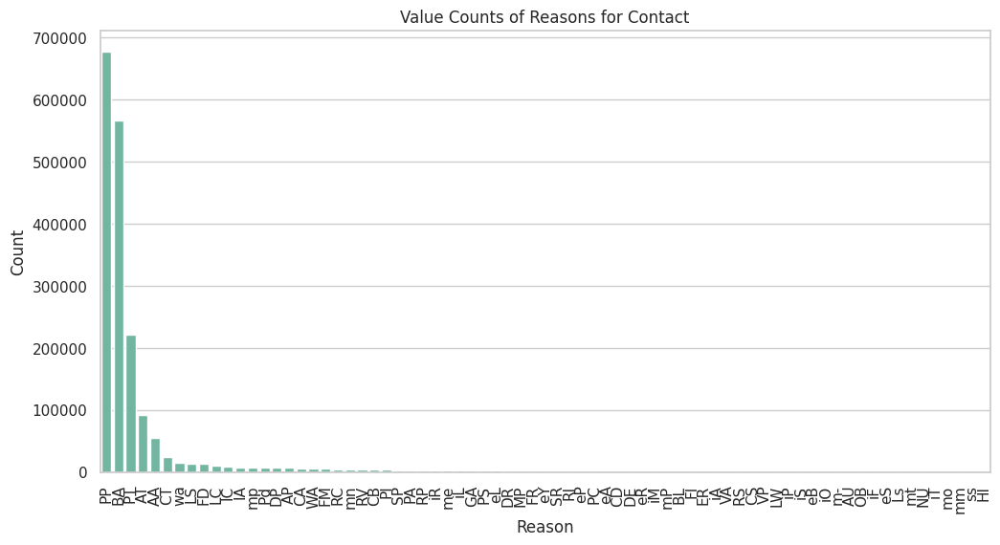

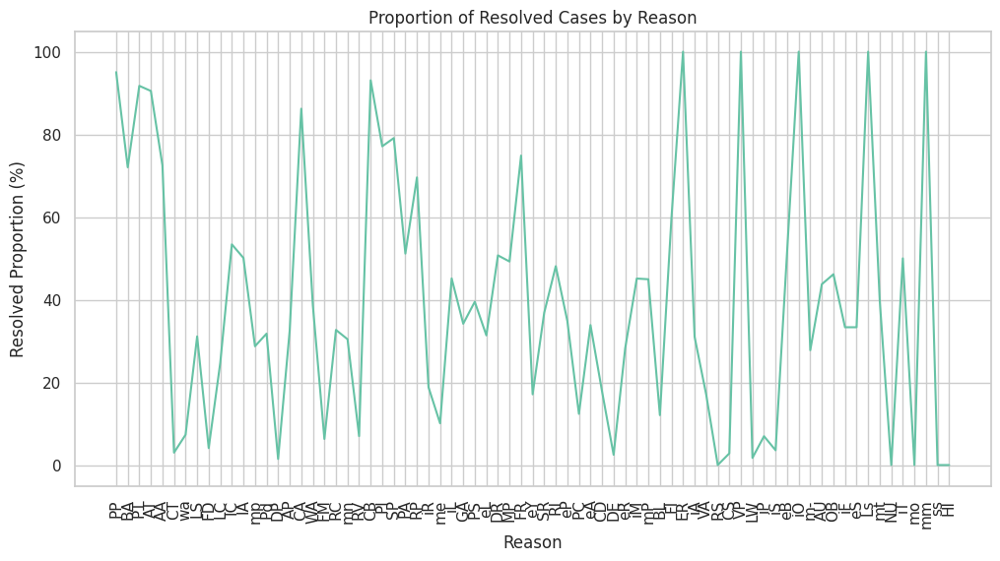

In [18]:
df= data.copy()
# Calculate value counts for each reason
value_counts = df['reason'].value_counts().reset_index()
value_counts.columns = ['reason', 'count']

# Calculate the proportion of 'resolved'
resolved_proportion = df.groupby('reason')['resolved'].apply(lambda x: (x == 'resolved').mean()).reset_index(name='resolved_proportion')

# Merge the counts and proportions on 'reason'
result = pd.merge(value_counts, resolved_proportion, on='reason')

# Sort the results by 'count' in descending order
result = result.sort_values(by='count', ascending=False)

# Print the sorted result
print(result)

# Prepare the data for visualization
df = result.copy()
df['resolved_proportion'] = df['resolved_proportion'] * 100

# Set the color palette
sns.set_palette('Set2')

# Create a bar chart for the value counts
plt.figure(figsize=(12, 6))
sns.barplot(x='reason', y='count', data=df)
plt.title('Value Counts of Reasons for Contact')
plt.xlabel('Reason')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

# Create a line chart for the resolved proportions
plt.figure(figsize=(12, 6))
sns.lineplot(x='reason', y='resolved_proportion', data=df)
plt.title('Proportion of Resolved Cases by Reason')
plt.xlabel('Reason')
plt.ylabel('Resolved Proportion (%)')
plt.xticks(rotation=90)
plt.show()


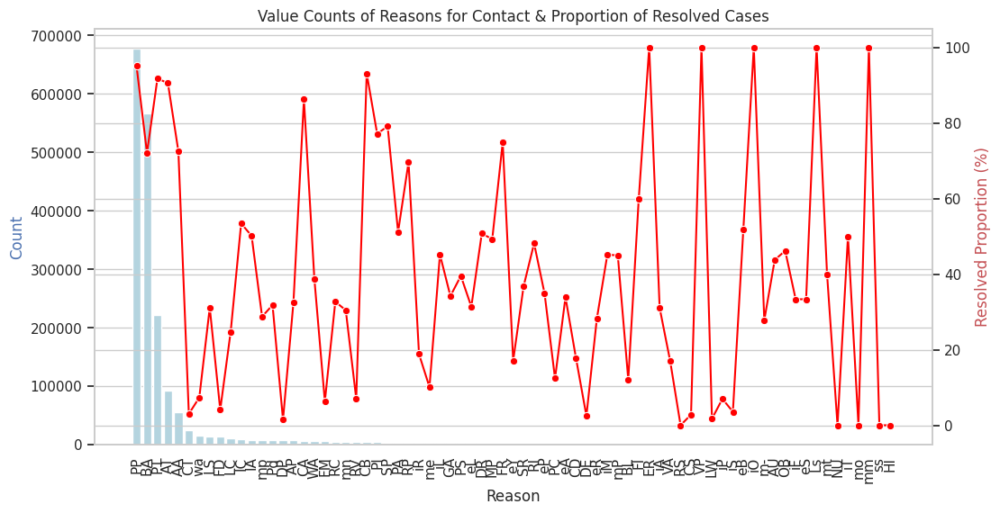

In [19]:
# Create figure and primary axis
plt.figure(figsize=(12, 6))
ax1 = sns.barplot(x='reason', y='count', data=df, color='lightblue')
ax1.set_title('Value Counts of Reasons for Contact & Proportion of Resolved Cases')
ax1.set_xlabel('Reason')
ax1.set_ylabel('Count', color='b')
plt.xticks(rotation=90)

# Create secondary axis
ax2 = ax1.twinx()
sns.lineplot(x='reason', y='resolved_proportion', data=df, sort=False, marker='o', color='red', ax=ax2)
ax2.set_ylabel('Resolved Proportion (%)', color='r')

# Show plot
plt.show()

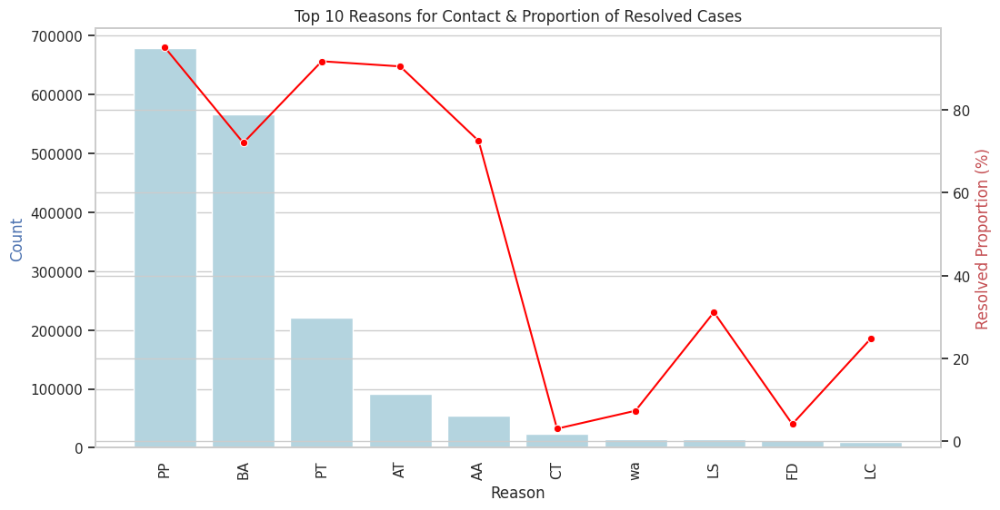

In [20]:
df = data.copy()

# Calculate value counts for each reason
value_counts = df['reason'].value_counts().reset_index()
value_counts.columns = ['reason', 'count']

# Calculate the proportion of 'resolved'
resolved_proportion = df.groupby('reason')['resolved'].apply(lambda x: (x == 'resolved').mean()).reset_index(name='resolved_proportion')

# Merge the counts and proportions on 'reason'
result = pd.merge(value_counts, resolved_proportion, on='reason')

# Sort the results by 'count' in descending order
result = result.sort_values(by='count', ascending=False)

# Now, let's limit the DataFrame to the top 10 reasons
top_10 = result.head(10).copy()
top_10['resolved_proportion'] = top_10['resolved_proportion'] * 100

# Visualize the top 10 using combined bar and line charts
plt.figure(figsize=(12, 6))
ax1 = sns.barplot(x='reason', y='count', data=top_10, color='lightblue')
ax1.set_title('Top 10 Reasons for Contact & Proportion of Resolved Cases')
ax1.set_xlabel('Reason')
ax1.set_ylabel('Count', color='b')
plt.xticks(rotation=90)

# Create secondary axis
ax2 = ax1.twinx()
sns.lineplot(x='reason', y='resolved_proportion', data=top_10, sort=False, marker='o', color='red', ax=ax2)
ax2.set_ylabel('Resolved Proportion (%)', color='r')

# Show plot
plt.show()